# **Лабораторная работа**
*Naumov Anton (Any0019)*

*To contact me in telegram: @any0019*

В данном задании вашей задачей будет построить и обучить модель CycleGAN для задачи Img2Img.

---

Про задачу __Img2Img__:

- У вас есть 2 множества изображений ($A$ и $B$)
- Ваша задача - научиться превращать изображения из множества $A$ в изображения из множества $B$ и наоборот
- Бывают paired и unpaired множества
- В случае __paired__ множеств - для каждого изображения из $A$ существует конкретное изображение из $B$, в которое оно должно перейти (и наоборот). Примером такой пары множеств может быть (а) спутниковая фотграфия местности vs схематическая карта местности , (б) фотография фасада здания vs схема фасада здания , ...
- В случае __unpaired__ множеств - между множествами нет конкретных пар. Примером такой пары множеств может быть (а) фотографии с лошадьми vs фотографии с зебрами , (б) фотографии vs рисунки конкретного художника , ...

---

Про модель __CycleGAN__:

- Модель придумана для задачи Img2Img (в первую очередь unpaired версии) и основана на концепции GAN-ов
- В модели есть 2 генератора: $G_{A -> B}$ (задача которого - принимая на вход изображение из множества $A$ переводить его в изображение из множества $B$) и $G_{B -> A}$ (аналогично в другую сторону)
- Надо отметить что на вход генераторы не получают никакую дополнительную случайность, что делает обучение таких моделей проще
- В модели так же есть 2 дискриминатора: $D_{A}$ (задача которого - отличать реальные изображения из $A$ от сгенерированных с помощью $G_{B -> A}$ изображений) и $D_{B}$ (аналогично для $B$)
- Функцией ошибки будет, как и для GAN-ов, minmax игра между генераторами и дискриминаторами, но к ошибке генераторов добавится ещё и, так называемый, `cycle consistency loss`, который проверяет, что после двойного перехода изображения не меняются $G_{B -> A} \big( G_{A -> B} ( a ) \big) = a ; \forall a \in A$ и $G_{A -> B} \big( G_{B -> A} ( b ) \big) = b ; \forall b \in B$
- Так же можно добавлять или нет штраф за то, чтобы $G_{B -> A}$ не меняла изображения из $A$ и наоборот $G_{A -> B}$ не меняла изображения из $B$
- Оригинальная статья: https://arxiv.org/pdf/1703.10593.pdf

---

Ваша задача - ноутбук разбит на несколько частей, каждая со своими баллами

1. __Подготовка данных__ _(2 балла)_ --> требуется выбрать датасет для обучения (дано несколько на выбор) и составить пайплайн подготовки данных
2. __Составление модели__ _(6 баллов)_ --> требуется собрать нейросеть _(3 балла)_ и создать функции ошибки _(3 балла)_
3. __Подготовка обучения__ _(2 балла)_ --> требуется написать шаги обучения и валидации, визуализацию, а так же полный цикл обучения
4. __Обучение__ _(2 балла)_ --> требуется обучить модель
5. __Сбор своего датасета и обучение модели на нём__ _(3 балла)_ --> требуется собрать свой датасет и обучить на нём модель

***За наиболее интересные и качественные решения в пункте 5 так же предусмотрены дополнительные баллы***

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import Dataset, DataLoader

from torchvision import datasets, transforms as tr

import numpy as np

import matplotlib.pyplot as plt
# %matplotlib inline

# Для тёмной темы jupyter - уберите если не нужно
#plt.style.use('dark_background')

from tqdm.auto import tqdm, trange

import os
import sys
import requests
import cv2
import functools

import typing as tp
import torchview

from dataclasses import dataclass

# 1. Подготовка данных (___2 балла___)

## 1.1 Выбор и скачивание датасета

In [2]:
# dataset_folder = "./img2img"# "/home/jupyter/datasphere/project/datasets/img2img"
# num_images_per_split = 5

# os.environ["dataset_folder"] = dataset_folder
# !mkdir -p ${dataset_folder}

# # В этом цикле каждый из предложенных датасетов
# #  - скачивается
# #  - распаковывается
# #  - отрисовывается + meta
# #  - удаляется

# # Предлагается посмотреть на все предложенные варианты датасетов и затем оставить один,
# #  с которым захочется работать больше всего - закомментируйте (или удалите) все, кроме
# #  выбранного, а так же закомментируйте строчки с удалением скачанного датасета
# for dataset_name in [
#     # Unpaired
#     "apple2orange",
#     "summer2winter_yosemite",
#     "horse2zebra",
#     "monet2photo",
#     "cezanne2photo",
#     "ukiyoe2photo",
#     "vangogh2photo",
#     # Paired
#     "maps",
#     "facades",
# ]:
#     print(f"Dataset '{dataset_name}'")
#     url = f"http://efrosgans.eecs.berkeley.edu/cyclegan/datasets/{dataset_name}.zip"
#     download_path = os.path.join(dataset_folder, f"{dataset_name}.zip")
#     target_folder = os.path.join(dataset_folder, dataset_name)
    
#     # Чтобы bash вызовы знали соответствующие переменные
#     os.environ["url"] = url
#     os.environ["download_path"] = download_path
#     os.environ["target_folder"] = target_folder
    
#     print("Loading zip file...", end="")
#     # Проверяем что нет такого загруженого файла
#     if not os.path.isfile(download_path) or os.path.exists(target_folder):
#         # # Можно загрузить через requests библиотеку
#         response = requests.get(url)
#         open(download_path, "wb").write(response.content)
        
#         # Можно загрузить через wget
#         #!wget ${url} -O ${download_path}
#     print(" --> done!")
    
#     print("Unziping...", end="")
#     # Распаковываем
#     if os.path.exists(target_folder):
#         !rm -r {target_folder}
#     !mkdir -p {dataset_folder}
#     !unzip -qq {download_path} -d {dataset_folder}
#     print(" --> done!")
    
#     # Удаляем zip-файл
#     !rm {download_path}
    
#     # Meta + Отрисовка
#     print(f"Provided splits: {os.listdir(target_folder)}")
#     # Удобный способ быстро получить датасет картинок с лэйблами, если картинки разложены по папкам в формате:
#     # root_folder/label_name/img.jpg
#     # (в нашем случае нет лэйблов, но картинки разложены в таком же формате, просто вместо label_name идёт
#     #  split_name: trainA/testA/trainB/testB)
#     dataset = datasets.ImageFolder(target_folder)

#     inds_to_show = {i: [] for i, _ in enumerate(dataset.classes)}
#     classes_full = 0
#     for dataset_ind in range(len(dataset)):
#         _, split_ind = dataset[dataset_ind]
#         if len(inds_to_show[split_ind]) == num_images_per_split:
#             continue
#         inds_to_show[split_ind].append(dataset_ind)
#         if len(inds_to_show[split_ind]) == num_images_per_split:
#             classes_full += 1
#         if classes_full == len(dataset.classes):
#             break

#     for split_name in sorted(dataset.classes):
#         split_ind = dataset.class_to_idx[split_name]
#         print(f"Split '{split_name}' of dataset '{dataset_name}'", end="")
#         split_folder = os.path.join(target_folder, split_name)
#         print(f" --> size: {len(os.listdir(split_folder))}")

#         plt.subplots(1, num_images_per_split, figsize=(5 * num_images_per_split, 5))
#         plt.suptitle(f"{dataset_name} ~ {split_name}", y=0.95)
#         for i, dataset_ind in enumerate(inds_to_show[split_ind]):
#             plt.subplot(1, num_images_per_split, i + 1)
#             plt.imshow(dataset[dataset_ind][0])
#             plt.xticks([])
#             plt.yticks([])
#         plt.show()
    
#     # Удаляем скачанный датасет
#     !rm -r {target_folder}
    
#     print("\n----------------------------\n")

## 1.2 Dataset и Transforms

В папке `target_folder` находятся несколько папок со сплитами для соответствующего датасета, в каждой папке сплита находятся сами `.jpg` изображения.

Давайте составим их в удобном для нас виде в отдельные датасеты для каждого сплита без лэйблов.

Для получения картинок можно использовать 
```python
cv2.imread(img_path)[:, :, ::-1]  # каналы записаны в обратном порядке
```

In [3]:
# Выбранный выше и скачанный датасет
dataset_folder = "./img2img"
dataset_name = "apple2orange"
target_folder = os.path.join(dataset_folder, dataset_name)

# Класс для датасета изображений без лэйблов с применением трансформов
class ImageDatasetNoLabel(Dataset):
    def __init__(self, path: str, transforms=None) -> None:
        super().__init__()
        self.path = path
        
        self.images = []
        img_filenames = sorted(list(os.walk(self.path))[0][2])
        for img_name in img_filenames:
            self.images.append(cv2.imread(os.path.join(path, img_name))[:, :, ::-1].copy())
        
        self.transforms = transforms
        
    def __getitem__(self, index):
        if self.transforms:
            return self.transforms(self.images[index])
        else:
            return self.images[index]
    
    def __len__(self):
        return len(self.images)

# Удобный класс для хранения всех наших датасетов
@dataclass
class DatasetsClass:
    train_a: ImageDatasetNoLabel
    train_b: ImageDatasetNoLabel
    test_a: ImageDatasetNoLabel
    test_b: ImageDatasetNoLabel


# Все датасеты без трансформов - чтобы посчитать статистики
ds = DatasetsClass(
    train_a=ImageDatasetNoLabel(os.path.join(target_folder, "trainA")),
    train_b=ImageDatasetNoLabel(os.path.join(target_folder, "trainB")),
    test_a=ImageDatasetNoLabel(os.path.join(target_folder, "testA")),
    test_b=ImageDatasetNoLabel(os.path.join(target_folder, "testB")),
)

In [4]:
def get_channel_statistics(dataset):
    """
    Функция для получения поканальных статистик (среднее и отклонение) по датасету
    """
    channel_mean = np.zeros(3, dtype=np.float64)
    channel_sqr = np.zeros(3, dtype=np.float64)
    size = len(dataset)
    for img in dataset:
        channel_mean += img.mean((0, 1)) / size
        channel_sqr += (img.astype(float)**2).mean((0, 1)) / size
    channel_std = np.sqrt(channel_sqr - channel_mean**2) / 255
    channel_mean /= 255
    
    return channel_mean, channel_std

# Поканальное среднее и отклонение для A
channel_mean_a, channel_std_a = get_channel_statistics(ds.train_a)
print(channel_mean_a, channel_std_a)

# Поканальное среднее и отклонение для B
channel_mean_b, channel_std_b = get_channel_statistics(ds.train_b)
print(channel_mean_b, channel_std_b)

[0.5921445  0.42005586 0.36589783] [0.30064179 0.33676326 0.33697565]
[0.65257136 0.48343966 0.29913012] [0.30252956 0.27753709 0.31164425]


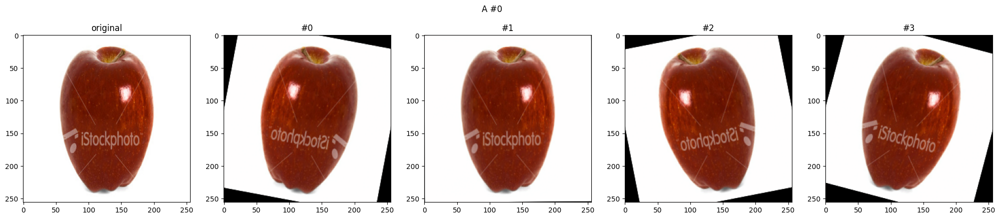

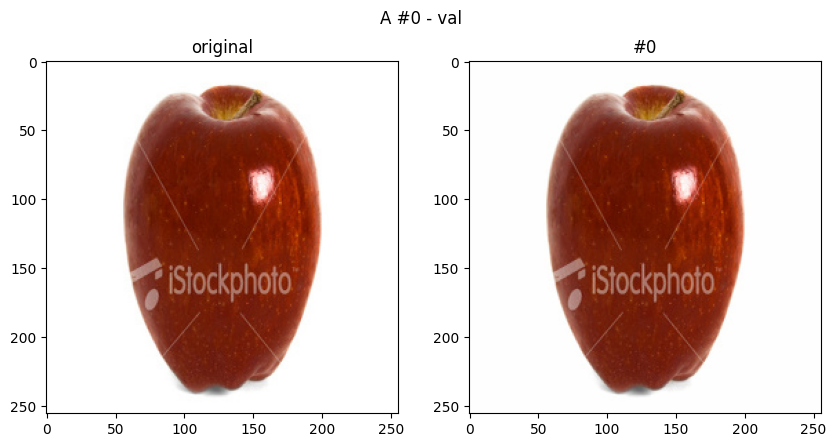

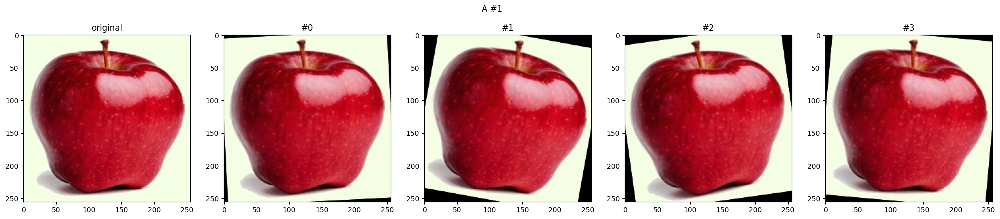

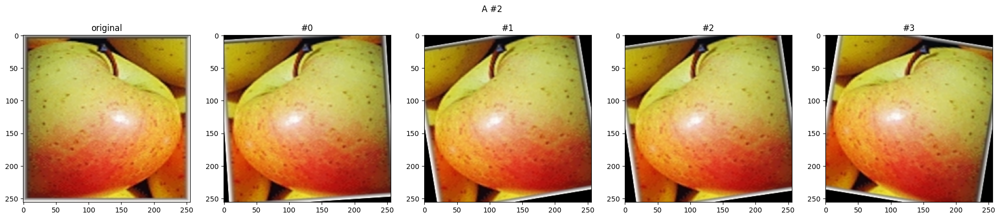

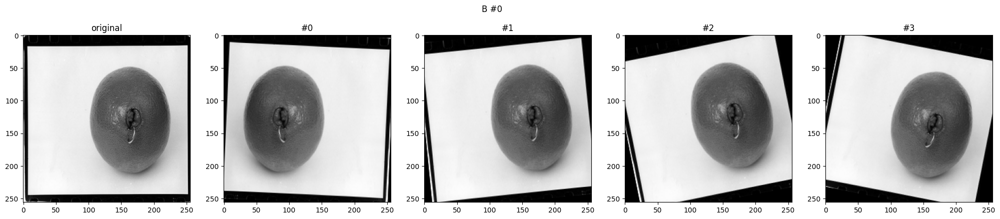

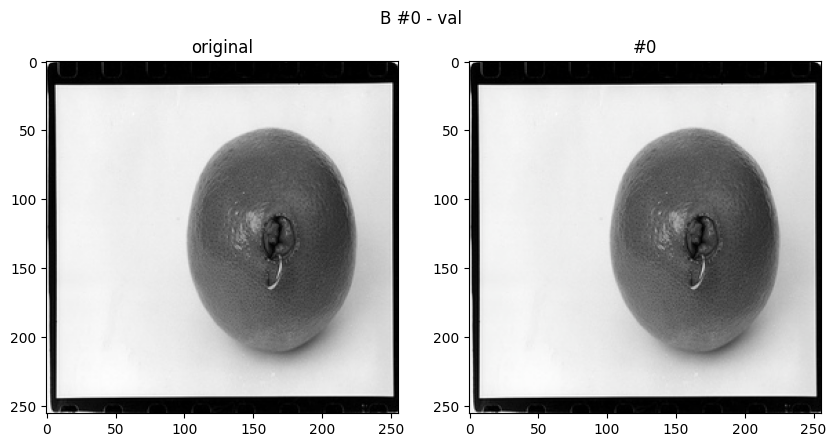

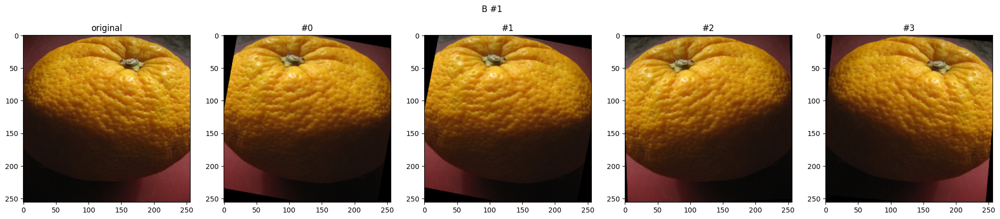

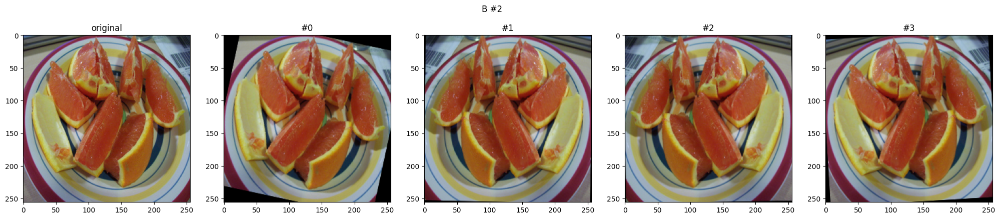

In [5]:
# Функция для получения train и val transform-ов, а так же функции для де-нормализации изображения
def get_transforms(mean, std, **kwargs):
    train_transform = tr.Compose([
        tr.ToPILImage(),
        tr.ToTensor(),
        tr.RandomRotation(degrees=15, interpolation=tr.InterpolationMode.BILINEAR),
        tr.RandomHorizontalFlip(0.5),
        tr.Normalize(mean=mean, std=std)
    ])
    
    val_transform = tr.Compose([
        tr.ToPILImage(),
        tr.ToTensor(),
        tr.Normalize(mean=mean, std=std)
    ])
    
    def de_normalize(img, normalized=True):
        img = img.detach().cpu().numpy().transpose((1, 2, 0))
        if normalized:
            denorm_img = np.clip(img * std[..., :] + mean[..., :], 0., 1.)
        else:
            denorm_img = img
        return denorm_img
    
    return train_transform, val_transform, de_normalize


# Ваши гиперпараметры
hyperparams = dict(
    
)
# transform-ы для A и B
train_transform_a, val_transform_a, de_normalize_a = get_transforms(channel_mean_a, channel_std_a, **hyperparams)
train_transform_b, val_transform_b, de_normalize_b = get_transforms(channel_mean_b, channel_std_b, **hyperparams)


# Функция для визуализации transform-ов
def show_examples(dataset, transform, de_norm, num_per_image=3, image_index=0, title=""):
    fig, ax = plt.subplots(1, 1 + num_per_image, figsize=(5 * (1 + num_per_image), 5))
    
    image = dataset[image_index]
    
    plt.suptitle(title, y=0.95)

    plt.subplot(1, 1 + num_per_image, 1)
    plt.imshow(image)
    plt.title("original")

    for i in range(num_per_image):
        plt.subplot(1, 1 + num_per_image, i + 2)
        plt.title(f"#{i}")
        plt.imshow(de_norm(transform(image)))
    plt.show()

# Проверка на адекватность
show_examples(ds.train_a, train_transform_a, de_normalize_a, num_per_image=4, image_index=0, title="A #0")
show_examples(ds.train_a, val_transform_a, de_normalize_a, num_per_image=1, image_index=0, title="A #0 - val")
show_examples(ds.train_a, train_transform_a, de_normalize_a, num_per_image=4, image_index=1, title="A #1")
show_examples(ds.train_a, train_transform_a, de_normalize_a, num_per_image=4, image_index=2, title="A #2")
show_examples(ds.train_b, train_transform_b, de_normalize_b, num_per_image=4, image_index=0, title="B #0")
show_examples(ds.train_b, val_transform_b, de_normalize_b, num_per_image=1, image_index=0, title="B #0 - val")
show_examples(ds.train_b, train_transform_b, de_normalize_b, num_per_image=4, image_index=1, title="B #1")
show_examples(ds.train_b, train_transform_b, de_normalize_b, num_per_image=4, image_index=2, title="B #2")

In [6]:
# Все датасеты с трансформами
ds = DatasetsClass(
    train_a=ImageDatasetNoLabel(
        os.path.join(target_folder, "trainA"),
        transforms=train_transform_a,
    ),
    train_b=ImageDatasetNoLabel(
        os.path.join(target_folder, "trainB"),
        transforms=val_transform_b,
    ),
    test_a=ImageDatasetNoLabel(
        os.path.join(target_folder, "testA"),
        transforms=val_transform_a,
    ),
    test_b=ImageDatasetNoLabel(
        os.path.join(target_folder, "testB"),
        transforms=val_transform_b,
    ),
)

## 1.3 DataLoader

In [7]:
@dataclass
class DataLoadersClass:
    train_a: DataLoader
    train_b: DataLoader
    test_a: DataLoader
    test_b: DataLoader

batch_size = 32

dataloaders = DataLoadersClass(
    train_a=DataLoader(
        dataset=ds.train_a,
        batch_size=batch_size,
        shuffle=True,
        drop_last=True,
    ),
    train_b=DataLoader(
        dataset=ds.train_b,
        batch_size=batch_size,
        shuffle=True,
        drop_last=True,
    ),
    test_a=DataLoader(
        dataset=ds.test_a,
        batch_size=batch_size,
        shuffle=False,
        drop_last=True,
    ),
    test_b=DataLoader(
        dataset=ds.test_b,
        batch_size=batch_size,
        shuffle=False,
        drop_last=True,
    ),
)

# 2. Модель (___6 баллов___)

## 2.0 Любые вспомогательные модули и классы

In [8]:
class UNetBlock(nn.Module):
    def __init__(
        self,
        in_channels: int,
        out_channels: int,
        dropout_p: float = 0.2
    ):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, padding='same', padding_mode='reflect'),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(True),
            nn.Dropout2d(dropout_p),
            nn.Conv2d(out_channels, out_channels, 3, padding='same', padding_mode='reflect'),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(True)
        )
        
    def forward(self, x):
        return self.block(x)
    
class UNetResizeConv(nn.Module):
    def __init__(
        self,
        in_channels: int,
        out_channels: int
    ):
        super().__init__()
        self.resize_conv = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.Conv2d(in_channels, out_channels, kernel_size=2, padding='same', padding_mode='reflect')
        )
        
    def forward(self, x):
        return self.resize_conv(x)
    
class UNetEncoder(nn.Module):
    def __init__(
        self,
        dims: tp.Sequence[int]
    ):
        super().__init__()
        
        self.encoder = nn.ModuleList([
            UNetBlock(dims[idx], dims[idx+1]) for idx in range(len(dims)-1)
        ])
        
        self.pool = nn.MaxPool2d(2)
        
    def forward(self, x):
        features = []
        for idx, block in enumerate(self.encoder):
            x = block(x)
            features.append(x)
            if idx < len(self.encoder) - 1:
                x = self.pool(x)
            
        return features
    
class UNetDecoder(nn.Module):
    def __init__(
        self,
        dims: tp.Sequence[int]
    ):
        super().__init__()
        
        self.dims = dims
        
        self.resize_conv = nn.ModuleList([
            UNetResizeConv(self.dims[idx], self.dims[idx + 1]) for idx in range(len(self.dims) - 1)
        ])
        
        self.deconv = nn.ModuleList([
            UNetBlock(self.dims[idx], self.dims[idx + 1]) for idx in range(len(self.dims) - 1)
        ])
        
    def forward(self, x, encoder_features):
        for idx in range(len(self.dims) - 1):
            x = self.resize_conv[idx](x)
            x = torch.cat((x, encoder_features[idx]), dim=1)
            x = self.deconv[idx](x)
        return x
    
class UNet(nn.Module):
    def __init__(
        self,
        channels: tp.Sequence[int]
    ):
        super().__init__()
        self.encoder = UNetEncoder(channels)
        self.decoder = UNetDecoder(channels[:0:-1])
        self.conv = nn.Conv2d(in_channels=channels[1], out_channels=channels[0], kernel_size=3, padding='same', padding_mode='reflect')

    def forward(self, x):
        encoder_features = self.encoder(x)
        y = self.decoder(encoder_features[::-1][0], encoder_features[::-1][1:])
        y = self.conv(y)
        
        return y

In [9]:
unet = UNet((3, 16, 32, 64, 128, 256))
x = torch.randn(1, 3, 256, 256)
unet(x).shape

torch.Size([1, 3, 256, 256])

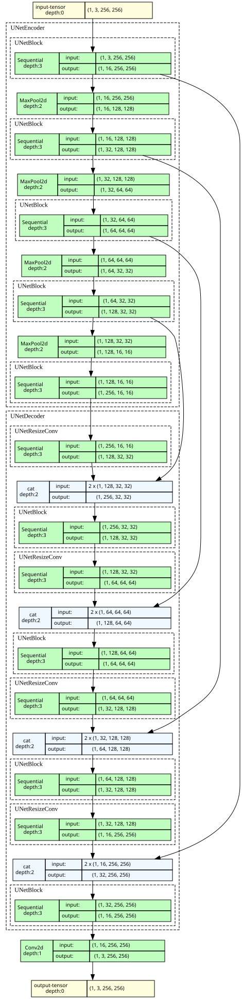

In [10]:
unet_graph = torchview.draw_graph(model=unet, input_data=x, depth=3, expand_nested=True, device='cpu')
unet_graph.visual_graph

In [11]:
pn = 0
for p in unet.parameters():
    pn += p.numel()
print(f"Total number of parameters: {pn}") 

Total number of parameters: 1944467


In [12]:
class PatchGANDiscriminator(nn.Module):
    def __init__(self, input_nc, ndf=64, n_layers=3, norm_layer=nn.BatchNorm2d):
        """Construct a PatchGAN discriminator

        Parameters:
            input_nc (int)  - the number of channels in input images
            ndf (int)       - the number of filters in the last conv layer
            n_layers (int)  - the number of conv layers in the discriminator
            norm_layer      - normalization layer
        """
        super().__init__()
        if type(norm_layer) == functools.partial:  # no need to use bias as BatchNorm2d has affine parameters
            use_bias = norm_layer.func == nn.InstanceNorm2d
        else:
            use_bias = norm_layer == nn.InstanceNorm2d

        kw = 4
        padw = 1
        sequence = [nn.Conv2d(input_nc, ndf, kernel_size=kw, stride=2, padding=padw), nn.LeakyReLU(0.2, True)]
        nf_mult = 1
        nf_mult_prev = 1
        for n in range(1, n_layers):
            nf_mult_prev = nf_mult
            nf_mult = min(2 ** n, 8)
            sequence += [
                nn.Conv2d(ndf * nf_mult_prev, ndf * nf_mult, kernel_size=kw, stride=2, padding=padw, bias=use_bias),
                norm_layer(ndf * nf_mult),
                nn.LeakyReLU(0.2, True)
            ]

        nf_mult_prev = nf_mult
        nf_mult = min(2 ** n_layers, 8)
        sequence += [
            nn.Conv2d(ndf * nf_mult_prev, ndf * nf_mult, kernel_size=kw, stride=1, padding=padw, bias=use_bias),
            norm_layer(ndf * nf_mult),
            nn.LeakyReLU(0.2, True)
        ]

        sequence += [nn.Conv2d(ndf * nf_mult, 1, kernel_size=kw, stride=1, padding=padw)]
        self.model = nn.Sequential(*sequence)

    def forward(self, x):
        y = self.model(x)
        return y #F.adaptive_avg_pool2d(y, output_size=1).squeeze(2, 3)

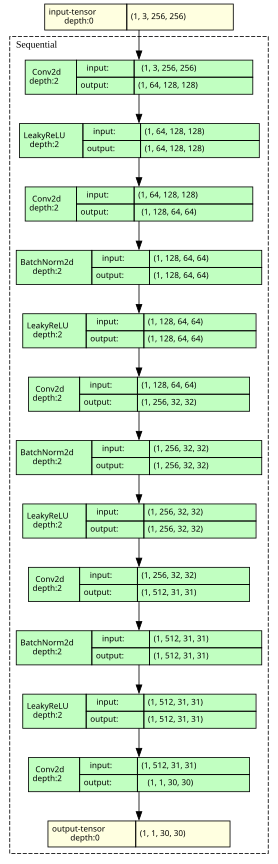

In [13]:
patchGAN_discriminator = PatchGANDiscriminator(3)
patchGAN_discriminator_graph = torchview.draw_graph(model=patchGAN_discriminator, input_data=x, depth=4, expand_nested=True, device='cpu')
patchGAN_discriminator_graph.visual_graph

In [14]:
pn = 0
for p in patchGAN_discriminator.parameters():
    pn += p.numel()
print(f"Total number of parameters: {pn}") 

Total number of parameters: 2765633


## 2.1 Архитектура сети (___3 балла___)

In [15]:
class CycleGAN(nn.Module):
    def __init__(
        self,
        generator_channels: tp.Sequence[int] = (3, 16, 32, 64, 128, 256),
        input_nc: int = 3,
        ndf: int = 64,
        n_layers: int = 3,
        norm_layer=nn.BatchNorm2d
    ) -> None:
        super().__init__()
        
        # generators
        self.G_AB = UNet(generator_channels)
        self.G_BA = UNet(generator_channels)
        
        # discriminators
        self.D_A = PatchGANDiscriminator(input_nc, ndf=ndf, n_layers=n_layers, norm_layer=norm_layer)
        self.D_B = PatchGANDiscriminator(input_nc, ndf=ndf, n_layers=n_layers, norm_layer=norm_layer)
        
    def forward(self, real_A, real_B):
        # generate fake images
        fake_B = self.G_AB(real_A)
        fake_A = self.G_BA(real_B)
        
        # cycle consistency: reconstruct the original images
        rec_A = self.G_BA(fake_B)
        rec_B = self.G_AB(fake_A)
        
        # discriminator outputs
        D_A_real = self.D_A(real_A)
        D_A_fake = self.D_A(fake_A)
        D_B_real = self.D_B(real_B)
        D_B_fake = self.D_B(fake_B)
        
        return {
            'fake_A': fake_A,
            'fake_B': fake_B,
            'rec_A': rec_A,
            'rec_B': rec_B,
            'D_A_real': D_A_real,
            'D_A_fake': D_A_fake,
            'D_B_real': D_B_real,
            'D_B_fake': D_B_fake
        }

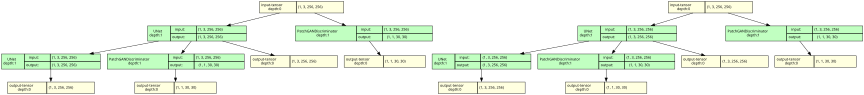

In [16]:
cycle_gan = CycleGAN()
torchview.draw_graph(cycle_gan, (x, torch.randn_like(x)), depth=1, device='cpu').visual_graph

In [17]:
pn = 0
for p in cycle_gan.parameters():
    pn += p.numel()
print(f"Total number of parameters: {pn}") 

Total number of parameters: 9420200


## 2.2 Loss (___3 балла___)

$$ \mathbf{L}_{\text{cyc}} \big( G_{A \rightarrow B}, G_{B \rightarrow A} \big) = \mathbb{E}_{a \sim A} \bigg( \Big\| G_{B \rightarrow A} \big( G_{A \rightarrow B} ( a ) \big) - a \Big\|_1 \bigg) + \mathbb{E}_{b \sim B} \bigg( \Big\| G_{A \rightarrow B} \big( G_{B \rightarrow A} ( b ) \big) - b \Big\|_1 \bigg) \longrightarrow \min_{G}$$

In [18]:
class CycleConsistencyLoss(nn.Module):
    """
    Функция ошибки, проверяющая что после двойного перехода через генераторы изображение не изменилось
    """
    def __init__(self):
        super().__init__()
        self.l1_loss = nn.L1Loss()
    
    def forward(self, x, x_rec):
        return self.l1_loss(x, x_rec)

$$ \mathbf{L}_{\text{GAN}} \big( G_{A \rightarrow B}, D_{B} \big) = \mathbb{E}_{b \sim B} \log D_{B} (b) + \mathbb{E}_{a \sim A} \log \Big( 1 - D_{B} \big( G_{A \rightarrow B} (a) \big) \Big) \longrightarrow \min_{G} \max_{D}$$

In [19]:
class AdversarialLossCE(nn.Module):
    """
    Стандартная функция ошибки для minmax игры GAN-ов
    """
    def __init__(self, use_sigmoid: bool = True):
        super().__init__()
        if not use_sigmoid:
            self.bce_loss = nn.BCELoss()
        else:
            self.bce_loss = nn.Sequential(
                nn.Sigmoid(),
                nn.BCELoss()
            )
    
    def forward(self, real_pred, fake_pred=None):
        # Принимает на вход D_{A}(a) - real_pred и D_{A}(G(b)) - fake_pred или наоборот
        # Может принимать только один аргумент для удобности использования в случае
        # обучения или генератора, или дискриминатора
        if fake_pred is None:
            # генератор: цель - чтобы предсказание было равно 1.
            target_real = torch.ones_like(real_pred)
            loss = self.bce_loss(real_pred, target_real)
        else:
            # дискриминатор: реальные изображения должны быть классифицированы как 1,
            # а сгенерированные - как 0.
            target_real = torch.ones_like(real_pred)
            target_fake = torch.zeros_like(fake_pred)
            loss_real = self.bce_loss(real_pred, target_real)
            loss_fake = self.bce_loss(fake_pred, target_fake)
            loss = loss_real + loss_fake
        return loss

$$ \mathbb{E}_{b \sim B} \big( D_{B} (b) - 1 \big)^2 + \mathbb{E}_{a \sim A} \Big( D_{B} \big( G_{A \rightarrow B} (a) \big) \Big)^2 \longrightarrow \min_{D} $$
$$ \mathbb{E}_{a \sim A} \Big( D_{B} \big( G_{A \rightarrow B} (a) \big) - 1 \Big)^2 \longrightarrow \min_{G} $$

In [20]:
class AdversarialLossMSE(nn.Module):
    """
    Можно переписать не через CE, а через MSE loss на одном предсказании, помогает со стабильностью
    """
    def __init__(self):
        super().__init__()
        self.mse_loss = nn.MSELoss()
    
    def forward(self, real_pred, fake_pred=None):
        # Принимает на вход D_{A}(a) - real_pred и D_{A}(G(b)) - fake_pred или наоборот
        # Может принимать только один аргумент для удобности использования в случае
        #  обучения или генератора, или дискриминатора
        if fake_pred is None:
            # генератор: цель: D(G(a)) -> 1
            target = torch.ones_like(real_pred)
            loss = self.mse_loss(real_pred, target)
        else:
            # дискриминатор:
            # для реальных изображений: D(b) -> 1
            target_real = torch.ones_like(real_pred)
            loss_real = self.mse_loss(real_pred, target_real)
            
            # для сгенерированных изображений: D(G(a)) -> 0
            target_fake = torch.zeros_like(fake_pred)
            loss_fake = self.mse_loss(fake_pred, target_fake)
            loss = loss_real + loss_fake
        
        return loss

$$ \mathbf{L} \big( G_{A \rightarrow B}, G_{B \rightarrow A}, D_{A}, D_{B} \big) = \mathbf{L}_{\text{GAN}} \big( G_{A \rightarrow B}, D_{B} \big) + \mathbf{L}_{\text{GAN}} \big( G_{B \rightarrow A}, D_{A} \big) + \lambda \cdot \mathbf{L}_{\text{cyc}} \big( G_{A \rightarrow B}, G_{B \rightarrow A} \big) \longrightarrow \min_{G} \max_{D}$$

In [21]:
class FullDiscriminatorLoss(nn.Module):
    """
    Полная ошибка для дискриминатора
    """
    def __init__(self, is_mse = True):
        super().__init__()
        
        if is_mse:
            self.adv_loss = AdversarialLossMSE()
        else:
            self.adv_loss = AdversarialLossCE()
    
    def forward(
        self,
        D_A_real, D_A_fake,
        D_B_real, D_B_fake
    ):
        loss_adv_A = self.adv_loss(D_A_real, D_A_fake)
        loss_adv_B = self.adv_loss(D_B_real, D_B_fake)
        loss_adv = loss_adv_A + loss_adv_B
        
        return loss_adv

In [22]:
dl = FullDiscriminatorLoss()
ra = torch.randn(1, 3, 256, 256)
rb = torch.randn_like(ra)
cycle_gan.to('cpu')
cg_output = cycle_gan(ra, rb)

dl(
    cg_output['D_A_real'], cg_output['D_A_fake'],
    cg_output['D_B_real'], cg_output['D_B_fake']
)

tensor(2.1023, grad_fn=<AddBackward0>)

In [23]:
class FullGeneratorLoss(nn.Module):
    """
    Полная ошибка для генератора
    """
    def __init__(self, lambda_value=10., is_mse=True):
        super().__init__()
        if is_mse:
            self.adv_loss = AdversarialLossMSE() 
        else:
            self.adv_loss = AdversarialLossCE()
            
        self.cycle_loss = CycleConsistencyLoss()
        self.lambda_value = lambda_value
    
    def forward(
        self,
        D_A_fake, D_B_fake,
        real_A, rec_A,
        real_B, rec_B
    ):
        loss_adv_A = self.adv_loss(D_A_fake)
        loss_adv_B = self.adv_loss(D_B_fake)
        loss_adv = loss_adv_A + loss_adv_B
        
        loss_cyc_A = self.cycle_loss(real_A, rec_A)
        loss_cyc_B = self.cycle_loss(real_B, rec_B)
        loss_cyc = loss_cyc_A + loss_cyc_B
        
        loss = loss_adv + self.lambda_value * loss_cyc
        
        return loss

In [24]:
gl = FullGeneratorLoss()
ra = torch.randn(1, 3, 256, 256)
rb = torch.randn_like(ra)
cycle_gan.to('cpu')
cg_output = cycle_gan(ra, rb)

gl(
    cg_output['D_A_fake'], cg_output['D_B_fake'],
    ra, cg_output['rec_A'],
    rb, cg_output['rec_B']
)

tensor(19.6751, grad_fn=<AddBackward0>)

# 3. Подготовка обучения (__2 балла__)

## 3.1 Шаг обучения дискриминатора

In [25]:
def train_discriminators(model, opt_d, loader_a, loader_b, criterion_d, device):
    model.train()
    losses_tr = []
    
    iter_a = iter(loader_a)
    iter_b = iter(loader_b)
    batches_per_epoch = min(len(iter_a), len(iter_b))
    
    for _ in trange(batches_per_epoch):
        imgs_a = next(iter_a).to(device)
        imgs_b = next(iter_b).to(device)
        
        opt_d.zero_grad()
        
        outputs = model(imgs_a, imgs_b)
        
        loss = criterion_d(
            D_A_real=outputs['D_A_real'], D_A_fake=outputs['D_A_fake'].detach(),
            D_B_real=outputs['D_B_real'], D_B_fake=outputs['D_B_fake'].detach()
        )
        
        loss.backward()
        opt_d.step()
        losses_tr.append(loss.item())
    
    return model, opt_d, np.mean(losses_tr)

## 3.2 Шаг обучения генератора

In [26]:
def train_generators(model, opt_g, loader_a, loader_b, criterion_g, device):
    model.train()
    losses_tr = []
    
    iter_a = iter(loader_a)
    iter_b = iter(loader_b)
    batches_per_epoch = min(len(iter_a), len(iter_b))
    
    for _ in trange(batches_per_epoch):
        imgs_a = next(iter_a).to(device)
        imgs_b = next(iter_b).to(device)
        
        opt_g.zero_grad()
        
        outputs = model(imgs_a, imgs_b)

        loss = criterion_g(
            D_A_fake=outputs['D_A_fake'], D_B_fake=outputs['D_B_fake'],
            real_A=imgs_a, rec_A=outputs['rec_A'],
            real_B=imgs_b, rec_B=outputs['rec_B']
        )

        loss.backward()
        opt_g.step()
        losses_tr.append(loss.item())
    
    return model, opt_g, np.mean(losses_tr)

## 3.3 Шаг валидации

In [27]:
from collections import defaultdict

def val(model, loader_a, loader_b, criterion_d, criterion_g, device):
    model.eval()
    
    val_data = defaultdict(list)

    with torch.no_grad():
        iter_a = iter(loader_a)
        iter_b = iter(loader_b)
        batches_per_epoch = min(len(iter_a), len(iter_b))

        for _ in trange(batches_per_epoch):
            imgs_a = next(iter_a).to(device)
            imgs_b = next(iter_b).to(device)
            
            outputs = model(imgs_a, imgs_b)
            
            loss_d = criterion_d(
                D_A_real=outputs['D_A_real'], D_A_fake=outputs['D_A_fake'].detach(),
                D_B_real=outputs['D_B_real'], D_B_fake=outputs['D_B_fake'].detach()
            )
            
            loss_g = criterion_g(
                D_A_fake=outputs['D_A_fake'], D_B_fake=outputs['D_B_fake'],
                real_A=imgs_a, rec_A=outputs['rec_A'],
                real_B=imgs_b, rec_B=outputs['rec_B']
            )
            
            val_data["loss D"].append(loss_d.item())
            val_data["loss G"].append(loss_g.item())
            
            # Оставлю для вас мой кусочек логирования для визуализации, думаю по аналогии
            #  разберётесь что предполагалось в каких переменных
            is_mse_pred = outputs['D_A_real'].shape[-1] != 2
            
            if is_mse_pred:
                # outputs['D_A_real'] = outputs['D_A_real'][:, 0]
                # outputs['D_B_real'] = outputs['D_B_real'][:, 0]
                # outputs['D_A_fake'] = outputs['D_A_fake'][:, 0]
                # outputs['D_B_fake'] = outputs['D_B_fake'][:, 0]
                outputs['D_A_real'] = outputs['D_A_real'].mean((2, 3))[:, 0]
                outputs['D_B_real'] = outputs['D_B_real'].mean((2, 3))[:, 0]
                outputs['D_A_fake'] = outputs['D_A_fake'].mean((2, 3))[:, 0]
                outputs['D_B_fake'] = outputs['D_B_fake'].mean((2, 3))[:, 0]
            else:
                # outputs['D_A_real'] = F.softmax(outputs['D_A_real'], dim=1)[:, 1]
                # outputs['D_B_real'] = F.softmax(outputs['D_B_real'], dim=1)[:, 1]
                # outputs['D_A_fake'] = F.softmax(outputs['D_A_fake'], dim=1)[:, 1]
                # outputs['D_B_fake'] = F.softmax(outputs['D_B_fake'], dim=1)[:, 1]
                raise NotImplementedError()
            
            val_data["real pred A"].extend(outputs['D_A_real'].cpu().detach().tolist())
            val_data["real pred B"].extend(outputs['D_B_real'].cpu().detach().tolist())
            val_data["fake pred A"].extend(outputs['D_A_fake'].cpu().detach().tolist())
            val_data["fake pred B"].extend(outputs['D_B_fake'].cpu().detach().tolist())
        
        val_data["loss D"] = np.mean(val_data["loss D"])
        val_data["loss G"] = np.mean(val_data["loss G"])
    
    return val_data

## 3.4 Визуализация сгенерированного

In [28]:
def draw_imgs(model, num_images, loader_a, loader_b, de_norm_a, de_norm_b, device):
    model.eval()
    with torch.no_grad():
        imgs_a = next(iter(loader_a))[:num_images].to(device)
        imgs_b = next(iter(loader_b))[:num_images].to(device)
        
        outputs = model(imgs_a, imgs_b)
        
        fake_a = outputs['fake_A']
        fake_b = outputs['fake_B']
        rec_a = outputs['rec_A']
        rec_b = outputs['rec_B']
        
        # Draw num_images examples for A
        fig, ax = plt.subplots(num_images, 3, figsize=(25, 15))
        plt.suptitle("Images from A", y=0.92)
        
        for ind in range(num_images):
            plt.subplot(num_images, 3, ind * 3 + 1)
            plt.title("Original from A")
            plt.imshow(de_norm_a(imgs_a[ind], normalized=True))
            plt.xticks([])
            plt.yticks([])
            
            plt.subplot(num_images, 3, ind * 3 + 2)
            plt.title("Translated to B")
            plt.imshow(de_norm_b(fake_b[ind], normalized=True))
            plt.xticks([])
            plt.yticks([])
            
            plt.subplot(num_images, 3, ind * 3 + 3)
            plt.title("Reconstructed A")
            plt.imshow(de_norm_a(rec_a[ind], normalized=True))
            plt.xticks([])
            plt.yticks([])
        
        # Draw num_images examples for B
        fig, ax = plt.subplots(num_images, 3, figsize=(25, 15))
        plt.suptitle("Images from B", y=0.92)
        
        for ind in range(num_images):
            plt.subplot(num_images, 3, ind * 3 + 1)
            plt.title("Original from B")
            plt.imshow(de_norm_b(imgs_b[ind], normalized=True))
            plt.xticks([])
            plt.yticks([])
            
            plt.subplot(num_images, 3, ind * 3 + 2)
            plt.title("Translated to A")
            plt.imshow(de_norm_a(fake_a[ind], normalized=True))
            plt.xticks([])
            plt.yticks([])
            
            plt.subplot(num_images, 3, ind * 3 + 3)
            plt.title("Reconstructed B")
            plt.imshow(de_norm_b(rec_b[ind], normalized=True))
            plt.xticks([])
            plt.yticks([])
    
        plt.show()

## 3.5 Цикл обучения

In [29]:
from IPython.display import clear_output
import warnings

def get_model_name(chkp_folder, model_name=None):
    # Выбираем имя чекпоинта для сохранения
    if model_name is None:
        if os.path.exists(chkp_folder):
            num_starts = len(os.listdir(chkp_folder)) + 1
        else:
            num_starts = 1
        model_name = f'model#{num_starts}'
    else:
        if "#" not in model_name:
            model_name += "#0"
    changed = False
    while os.path.exists(os.path.join(chkp_folder, model_name + '.pt')):
        model_name, ind = model_name.split("#")
        model_name += f"#{int(ind) + 1}"
        changed=True
    if changed:
        warnings.warn(f"Selected model_name was used already! To avoid possible overwrite - model_name changed to {model_name}")
    return model_name


def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']


def learning_loop(
    model,
    optimizer_g,
    g_iters_per_epoch,
    optimizer_d,
    d_iters_per_epoch,
    train_loader_a,
    train_loader_b,
    val_loader_a,
    val_loader_b,
    criterion_d,
    criterion_g,
    de_norm_a,
    de_norm_b,
    scheduler_d=None,
    scheduler_g=None,
    min_lr=None,
    epochs=10,
    val_every=1,
    draw_every=1,
    model_name=None,
    chkp_folder="./chkps",
    images_per_validation=3,
    plots=None,
    starting_epoch=0,
    device='cpu'
):
    model_name = get_model_name(chkp_folder, model_name)
    
    if plots is None:
        plots = {
            'train G': [],
            'train D': [],
            'val D': [],
            'val G': [],
            "lr G": [],
            "lr D": [],
            "hist real A": [],
            "hist gen A": [],
            "hist real B": [],
            "hist gen B": [],
        }

    for epoch in np.arange(1, epochs+1) + starting_epoch:
        print(f'#{epoch}/{epochs}:')

        plots['lr G'].append(get_lr(optimizer_g))
        plots['lr D'].append(get_lr(optimizer_d))
        
        # train discriminators
        print(f"train discriminators ({d_iters_per_epoch} times)")
        loss_d = []
        for _ in range(d_iters_per_epoch):
            model, optimizer_d, loss = train_discriminators(model, optimizer_d, train_loader_a, train_loader_b, criterion_d, device)
            loss_d.append(loss)
        plots['train D'].extend(loss_d)
        
        # train generators
        print(f"train generators ({g_iters_per_epoch} times)")
        loss_g = []
        for _ in range(g_iters_per_epoch):
            model, optimizer_g, loss = train_generators(model, optimizer_g, train_loader_a, train_loader_b, criterion_g, device)
            loss_g.append(loss)
        plots['train G'].extend(loss_g)

        if not (epoch % val_every):
            print("validate")
            val_data = val(model, val_loader_a, val_loader_b, criterion_d, criterion_g, device)
            plots['val D'].append(val_data["loss D"])
            plots['val G'].append(val_data["loss G"])
            plots['hist real A'].append(val_data["real pred A"])
            plots['hist gen A'].append(val_data["fake pred A"])
            plots['hist real B'].append(val_data["real pred B"])
            plots['hist gen B'].append(val_data["fake pred B"])
            
            # Сохраняем модель
            if not os.path.exists(chkp_folder):
                os.makedirs(chkp_folder)
            torch.save(
                {
                    'epoch': epoch,
                    'model_state_dict': model.state_dict(),
                    'optimizer_d_state_dict': optimizer_d.state_dict(),
                    'optimizer_g_state_dict': optimizer_g.state_dict(),
                    'scheduler_d_state_dict': scheduler_d.state_dict(),
                    'scheduler_g_state_dict': scheduler_g.state_dict(),
                    'plots': plots,
                },
                os.path.join(chkp_folder, model_name + '.pt'),
            )
            
            # Шедулинг
            if scheduler_d:
                try:
                    scheduler_d.step()
                except:
                    scheduler_d.step(np.mean(loss_d))
            if scheduler_g:
                try:
                    scheduler_g.step()
                except:
                    scheduler_g.step(np.mean(loss_g))

        if not (epoch % draw_every):
            clear_output(True)
            
            hh = 2
            ww = 2
            plt_ind = 1
            fig, ax = plt.subplots(hh, ww, figsize=(25, 12))
            fig.suptitle(f'#{epoch}/{epochs}:')

            plt.subplot(hh, ww, plt_ind)
            plt.title('discriminators losses')
            d_plot_step = 1. / d_iters_per_epoch
            plt.plot(np.arange(d_plot_step, epoch + d_plot_step, d_plot_step), plots['train D'], 'r.-', label='train', alpha=0.7)
            plt.plot(np.arange(1, epoch + 1), plots['val D'], 'g.-', label='val', alpha=0.7)
            plt.grid()
            plt.legend()
            plt_ind += 1
            
            plt.subplot(hh, ww, plt_ind)
            plt.title('generators losses')
            g_plot_step = 1. / g_iters_per_epoch
            plt.plot(np.arange(g_plot_step, epoch + g_plot_step, g_plot_step), plots['train G'], 'r.-', label='train', alpha=0.7)
            plt.plot(np.arange(1, epoch + 1), plots['val G'], 'g.-', label='val', alpha=0.7)
            plt.grid()
            plt.legend()
            plt_ind += 1
            
            # plt.subplot(hh, ww, plt_ind)
            # plt.title('learning rates')
            # plt.plot(plots["lr D"], 'b.-', label='lr discriminator', alpha=0.7)
            # plt.plot(plots["lr G"], 'm.-', label='lr generator', alpha=0.7)
            # plt.legend()
            # plt_ind += 1
            
            plt.subplot(hh, ww, plt_ind)
            plt.title("Discriminator A predictions")
            plt.hist(plots["hist real A"][-1], bins=50, density=True, label="real", color="green", alpha=0.7)
            plt.hist(plots["hist gen A"][-1], bins=50, density=True, label="generated", color="red", alpha=0.7)
            plt.xlim((-0.05, 1.05))
            plt.xticks(ticks=np.arange(0, 1.05, 0.1))
            plt.legend()
            plt_ind += 1
            
            plt.subplot(hh, ww, plt_ind)
            plt.title("Discriminator B predictions")
            plt.hist(plots["hist real B"][-1], bins=50, density=True, label="real", color="green", alpha=0.7)
            plt.hist(plots["hist gen B"][-1], bins=50, density=True, label="generated", color="red", alpha=0.7)
            plt.xlim((-0.05, 1.05))
            plt.xticks(ticks=np.arange(0, 1.05, 0.1))
            plt.legend()
            plt_ind += 1
            
            plt.show()
            
            draw_imgs(model, images_per_validation, val_loader_a, val_loader_b, de_norm_a, de_norm_b, device)
                
        
        if min_lr and get_lr(optimizer_d) <= min_lr:
            print(f'Learning process ended with early stop for discriminator after epoch {epoch}')
            break
        
        if min_lr and get_lr(optimizer_g) <= min_lr:
            print(f'Learning process ended with early stop for generator after epoch {epoch}')
            break
    
    return model, optimizer_d, optimizer_g, plots

# 4. Обучение (___2 балла___)

## 4.1 Инициализация модели и оптимайзера

In [30]:
from collections import defaultdict
from termcolor import colored


def beautiful_int(i):
    i = str(i)
    return ".".join(reversed([i[max(j, 0):j+3] for j in range(len(i) - 3, -3, -3)]))


# Подсчёт числа параметров в нашей модели
def model_num_params(model, verbose_all=True, verbose_only_learnable=False):
    sum_params = 0
    sum_learnable_params = 0
    submodules = defaultdict(lambda : [0, 0])
    for name, param in model.named_parameters():
        num_params = param.numel()
        if verbose_all or (verbose_only_learnable and param.requires_grad):
            print(
                colored(
                    '{: <65} ~  {: <9} params ~ grad: {}'.format(
                        name,
                        beautiful_int(num_params),
                        param.requires_grad,
                    ),
                    {True: "green", False: "red"}[param.requires_grad],
                )
            )
        sum_params += num_params
        sm = name.split(".")[0]
        submodules[sm][0] += num_params
        if param.requires_grad:
            sum_learnable_params += num_params
            submodules[sm][1] += num_params
    print(
        f'\nIn total:\n  - {beautiful_int(sum_params)} params\n  - {beautiful_int(sum_learnable_params)} learnable params'
    )
    
    for sm, v in submodules.items():
        print(
            f"\n . {sm}:\n .   - {beautiful_int(submodules[sm][0])} params\n .   - {beautiful_int(submodules[sm][1])} learnable params"
        )
    return sum_params, sum_learnable_params

In [31]:
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

def create_model_and_optimizer(model_class, model_params, lr=1e-3, device=device):
    model = model_class(**model_params)
    model = model.to(device)
    
    optimizer_d = torch.optim.AdamW(
        [*model.D_A.parameters(), *model.D_B.parameters()],
        lr,
        weight_decay=1e-8,
    )
    
    optimizer_g = torch.optim.AdamW(
        [*model.G_AB.parameters(), *model.G_BA.parameters()],
        lr,
        weight_decay=1e-8,
    )
    
    return model, optimizer_d, optimizer_g

## 4.2 Фактическое обучение

In [32]:
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

num_epochs = 100

results = []

model, optimizer_d, optimizer_g = create_model_and_optimizer(
    model_class = CycleGAN,
    model_params = {
        'generator_channels' : (3, 16, 32, 64, 128, 256),
        'input_nc' : 3,
        'ndf' :  64,
        'n_layers': 3,
        'norm_layer': nn.BatchNorm2d
    },
    lr = 1e-3,
    device = device,
)



scheduler_d = torch.optim.lr_scheduler.OneCycleLR(
    optimizer_d, 
    max_lr=5e-4, 
    pct_start=0.4,
    steps_per_epoch=1,
    epochs=num_epochs,
    three_phase=False,
    div_factor=1e3,
    final_div_factor=1e0
)

scheduler_g = torch.optim.lr_scheduler.OneCycleLR(
    optimizer_g, 
    max_lr=5e-4, 
    pct_start=0.4,
    steps_per_epoch=1,
    epochs=num_epochs,
    three_phase=False,
    div_factor=1e3,
    final_div_factor=1e0
)

criterion_d = FullDiscriminatorLoss(is_mse=True)
criterion_g = FullGeneratorLoss(is_mse=True)

sum_params, sum_learnable_params = model_num_params(model)

G_AB.encoder.encoder.0.block.0.weight                             ~  432       params ~ grad: True
G_AB.encoder.encoder.0.block.0.bias                               ~  16        params ~ grad: True
G_AB.encoder.encoder.0.block.1.weight                             ~  16        params ~ grad: True
G_AB.encoder.encoder.0.block.1.bias                               ~  16        params ~ grad: True
G_AB.encoder.encoder.0.block.4.weight                             ~  2.304     params ~ grad: True
G_AB.encoder.encoder.0.block.4.bias                               ~  16        params ~ grad: True
G_AB.encoder.encoder.0.block.5.weight                             ~  16        params ~ grad: True
G_AB.encoder.encoder.0.block.5.bias                               ~  16        params ~ grad: True
G_AB.encoder.encoder.1.block.0.weight                             ~  4.608     params ~ grad: True
G_AB.encoder.encoder.1.block.0.bias                               ~  32        params ~ grad: True
G_AB.encod

In [33]:
model

CycleGAN(
  (G_AB): UNet(
    (encoder): UNetEncoder(
      (encoder): ModuleList(
        (0): UNetBlock(
          (block): Sequential(
            (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=same, padding_mode=reflect)
            (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU(inplace=True)
            (3): Dropout2d(p=0.2, inplace=False)
            (4): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=same, padding_mode=reflect)
            (5): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (6): ReLU(inplace=True)
          )
        )
        (1): UNetBlock(
          (block): Sequential(
            (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=same, padding_mode=reflect)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU(inplace=True)
            (3): Dropout2d(p=

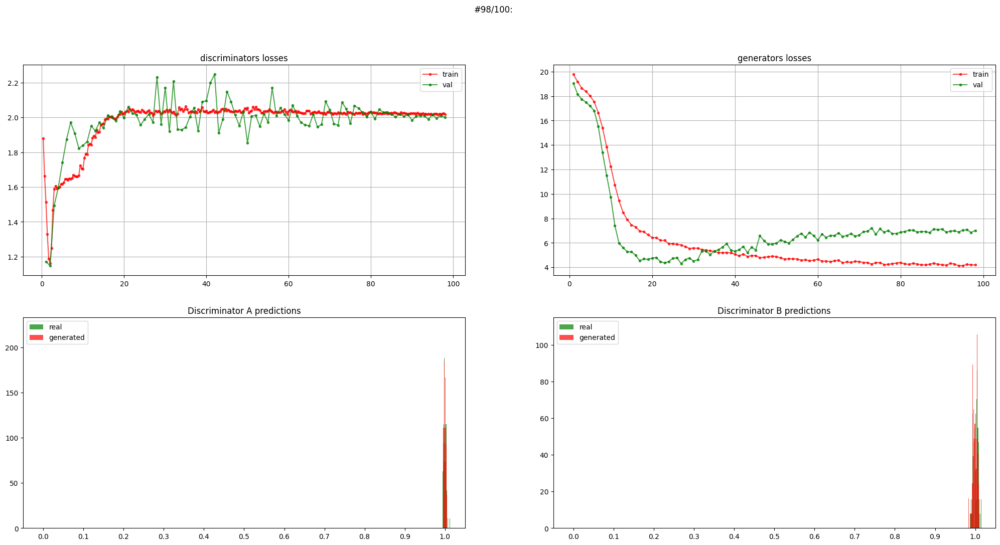

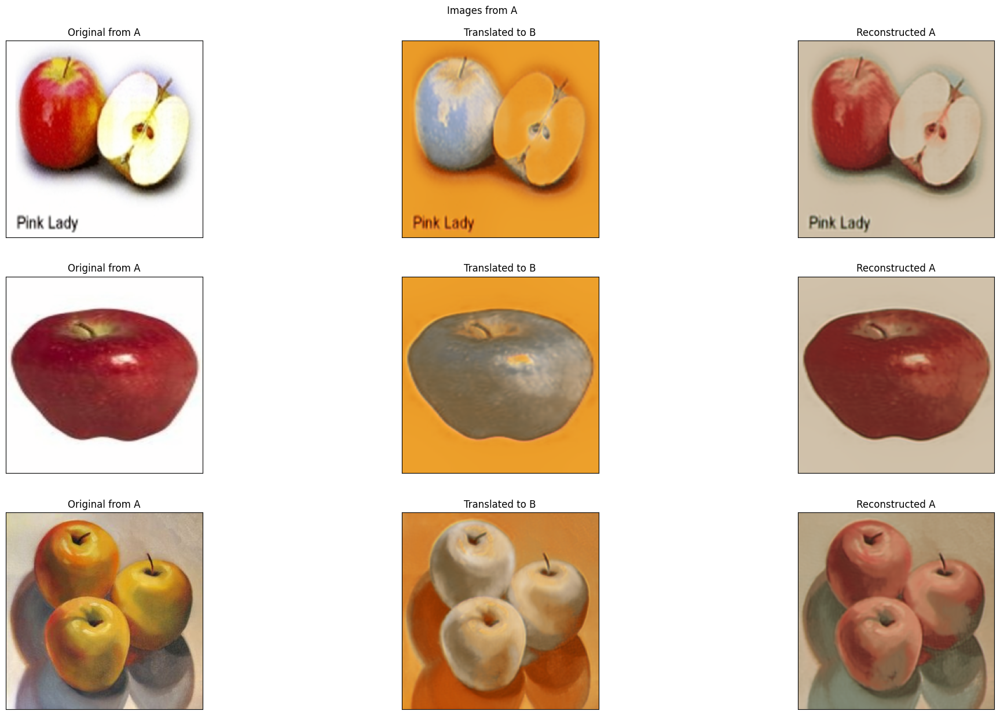

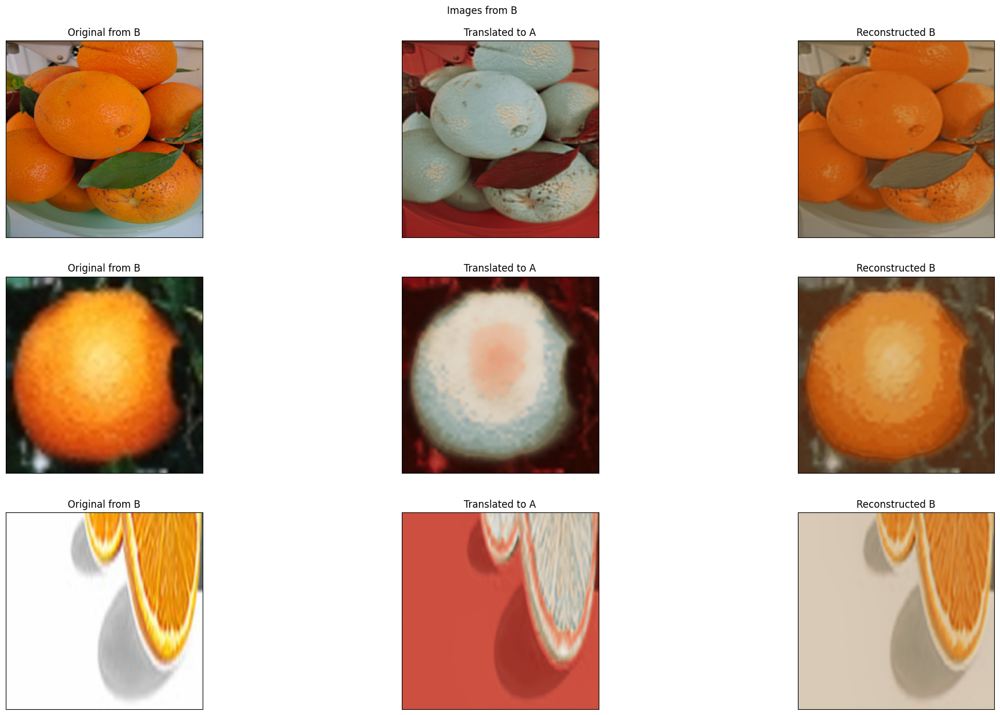

Learning process ended with early stop for discriminator after epoch 98


In [34]:
model, optimizer_d, optimizer_g, plots = learning_loop(
    model = model,
    optimizer_g = optimizer_g,
    g_iters_per_epoch = 1,
    optimizer_d = optimizer_d,
    d_iters_per_epoch = 3,#1,
    train_loader_a = dataloaders.train_a,
    train_loader_b = dataloaders.train_b,
    val_loader_a = dataloaders.test_a,
    val_loader_b = dataloaders.test_b,
    criterion_d = criterion_d,
    criterion_g = criterion_g,
    scheduler_g = scheduler_g,
    scheduler_d = scheduler_d,
    de_norm_a = de_normalize_a,
    de_norm_b = de_normalize_b,
    epochs = 100,
    min_lr = 1e-6,
    val_every = 1,
    draw_every = 1,
    chkp_folder = "./chkp",
    model_name = "cycle_gan",
    images_per_validation=3,
    plots=None,
    starting_epoch=0,
    device=device
)

In [35]:
model

CycleGAN(
  (G_AB): UNet(
    (encoder): UNetEncoder(
      (encoder): ModuleList(
        (0): UNetBlock(
          (block): Sequential(
            (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=same, padding_mode=reflect)
            (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU(inplace=True)
            (3): Dropout2d(p=0.2, inplace=False)
            (4): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=same, padding_mode=reflect)
            (5): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (6): ReLU(inplace=True)
          )
        )
        (1): UNetBlock(
          (block): Sequential(
            (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=same, padding_mode=reflect)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU(inplace=True)
            (3): Dropout2d(p=

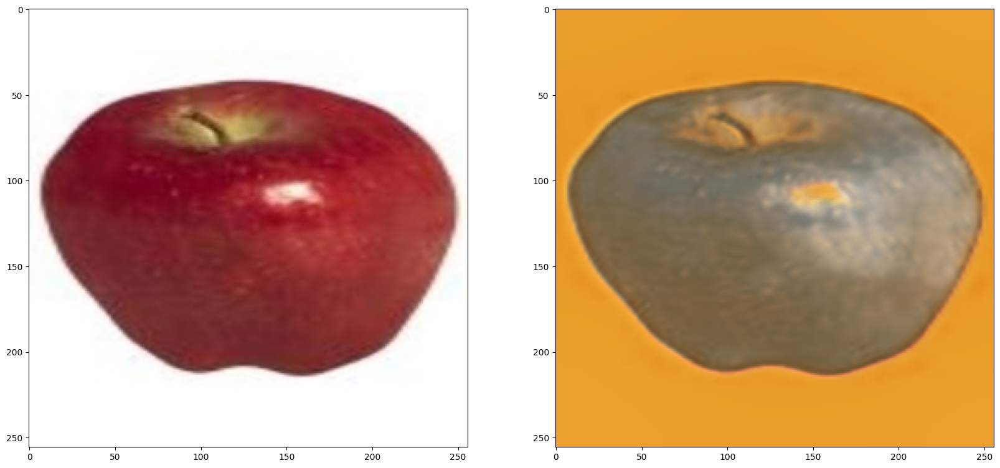

In [36]:
img_a = ds.test_a[1].to(device).unsqueeze(0)

plt.subplots(1, 2, figsize=(20, 10))

plt.subplot(121)
plt.imshow(de_normalize_a(img_a[0].detach().cpu()))

plt.subplot(122)
plt.imshow(de_normalize_b(model.G_AB(img_a)[0].detach().cpu()))

plt.show()

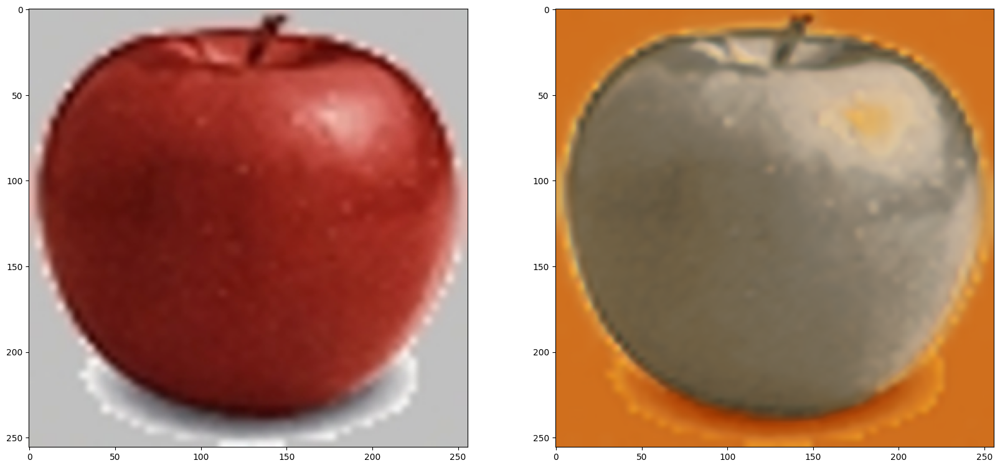

In [37]:
img_a = ds.test_a[5].to(device).unsqueeze(0)

plt.subplots(1, 2, figsize=(20, 10))

plt.subplot(121)
plt.imshow(de_normalize_a(img_a[0].detach().cpu()))

plt.subplot(122)
plt.imshow(de_normalize_b(model.G_AB(img_a)[0].detach().cpu()))

plt.show()

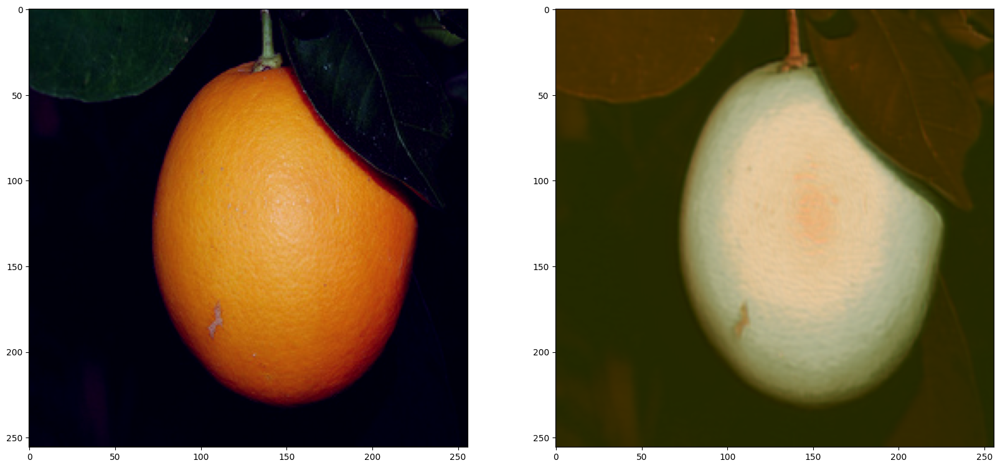

In [38]:
img_ind = 55
img_b = ds.test_b[img_ind].to(device).unsqueeze(0)
fake_a = model.G_BA(img_b)

plt.subplots(1, 2, figsize=(20, 10))

plt.subplot(121)
plt.imshow(de_normalize_a(img_b[0].detach().cpu()))

plt.subplot(122)
plt.imshow(de_normalize_b(fake_a[0].detach().cpu()))

plt.show()

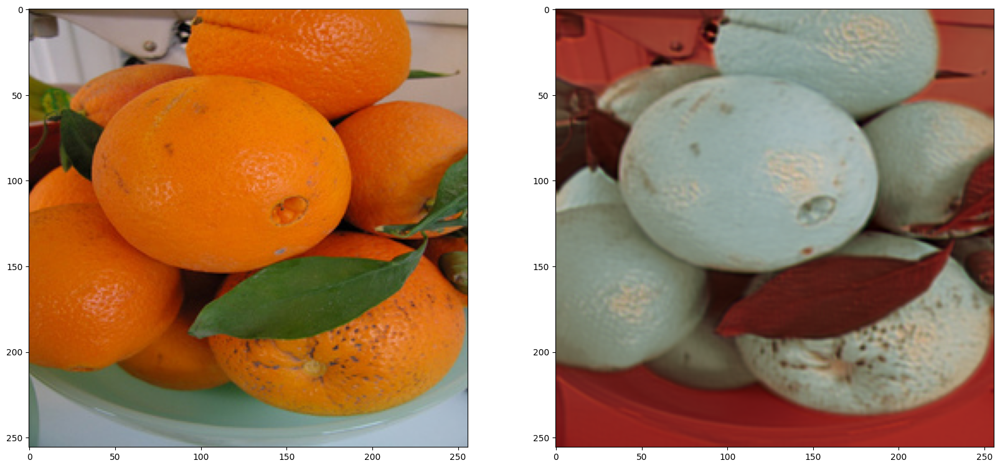

In [39]:
img_ind = 0
img_b = ds.test_b[img_ind].to(device).unsqueeze(0)
fake_a = model.G_BA(img_b)

plt.subplots(1, 2, figsize=(20, 10))

plt.subplot(121)
plt.imshow(de_normalize_b(img_b[0].detach().cpu()))

plt.subplot(122)
plt.imshow(de_normalize_a(fake_a[0].detach().cpu()))

plt.show()

# 5. Свои данные (___3 балла + бонусы___)

В этой части необходимо выполнить следующее:

1. **Создание датасетов**  
   * Соберите один или пару небольших датасета (минимум 100 примеров, но чем больше, тем лучше).  
   * Дайте волю фантазии, но избегайте неадекватного контента, объема данных или данных за рамками норм.  

2. **Обучение CycleGAN**  
   * Обучите модель CycleGAN для преобразования между вашим датасетом (**домен A**) и другим датасетом (**домен B**).  
   * Второй датасет может быть вашим собственным или любым существующим  

3. **Требования к сдаче**  
   * **Архив с датасетами**:  
     Приложите ссылку на заархивированные данные или загрузите сам архив с данными, использованные для обучения.  
   * **Jupyter Notebook**:  
     * Визуализируйте примеры из доменов A и B с кратким описанием идеи (например, "преобразование эскизов в цветные рисунки").  
     * Добавьте код обучения модели (архитектура, гиперпараметры, функция потерь).  
     * Покажите результаты работы модели (минимум по 5 примеров преобразований A→B и B→A).  
   * **Hugging Face Space + Streamlit**:  
     * Разработайте интерактивное приложение с использованием Streamlit, которое позволяет:  
       - Загружать изображения из доменов A и B.  
       - Отображать результаты преобразований (A→B и B→A) в реальном времени.  
     * Выложите приложение в Hugging Face Space и приложите ссылку на него.  
     * Убедитесь, что модель интегрирована в приложение, а проверяющие могут самостоятельно тестировать её через интерфейс.  

4. **Критерии оценки**  
   * Дополнительные баллы начисляются за:  
     - Креативные и качественные датасеты.  
     - Высокое качество преобразований (четкость, сохранение структуры, отсутствие артефактов).  
     - Удобный и наглядный интерфейс Streamlit-приложения.  

**Примеры идей для датасетов**:  
- Эскизы → Реалистичные изображения.  
- Дневные фото → Ночные фото.  
- Картины в стиле импрессионизма → фотореализм.  

**Важно**:  
- Проверяющий будет оценивать работу через ваше Streamlit-приложение. Убедитесь, что инференс работает стабильно.  
- Если модель слишком велика для деплоя, используйте оптимизацию.  

___Удачи!___ 🚀